In [1]:
import pandas as pd
import scanpy as sc
import numpy as np
import pickle
import gc

from collections import defaultdict

import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sb
import upsetplot as usp
from matplotlib.patches import Patch
import venn 
from adjustText import adjust_text
from matplotlib.lines import Line2D

from sklearn.preprocessing import minmax_scale,maxabs_scale

import diffxpy.api as de
from diffxpy.testing.det import DifferentialExpressionTestWald

from statsmodels.stats.multitest import multipletests

from scipy.cluster.hierarchy import linkage,dendrogram,fcluster,leaves_list
from scipy.cluster import hierarchy
from scipy.spatial.distance import pdist

import sys
sys.path.insert(0, '/lustre/groups/ml01/code/karin.hrovatin/diabetes_analysis/')
import helper as h
import importlib
importlib.reload(h)
import helper as h
sys.path.insert(0, '/lustre/groups/ml01/code/karin.hrovatin/diabetes_analysis/data_exploration/')
import helper_diffxpy as hde
importlib.reload(hde)
import helper_diffxpy as hde

import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
pandas2ri.activate()
%load_ext rpy2.ipython

import rpy2.rinterface_lib.callbacks
import logging
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

from rpy2.robjects.packages import importr
grdevices = importr('grDevices')

In [2]:
%%R
library('ComplexHeatmap')
library(viridis)
library(proxy)
library(seriation)
library(dendextend)

In [3]:
ro.r('library(edgeR)')
ro.r('library("hypeR")')
ro.r("source(paste(Sys.getenv('WSC'),'diabetes_analysis/data_exploration/','helper_hypeR.R',sep=''))")

value,[RTYPES.CLOSXP]
visible,[RTYPES.LGLSXP]


In [48]:
path_data='/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/combined/'
path_save_r='/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/combined/celltypes_embryo/'
path_fig='/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/figures/paper/'
path_genes='/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/gene_lists/'

In [5]:
# Load adata (for DE)
adata_full=sc.read(path_data+'data_integrated_analysed.h5ad')

In [6]:
# Load var only
var=sc.read(path_data+'data_integrated_analysed.h5ad',backed='r').raw.var.copy()

In [7]:
# Load rawnorm (for plottting). Correctly norm expression is in layers X_sf_integrated
adata_rn=sc.read(path_data+'data_rawnorm_integrated_annotated.h5ad')
adata_rn.X=adata_rn.layers['X_sf_integrated']

#### Make cell clusters

For analysis make pseudobulk per sample and ct, using original ct annotation (i.e. annotation from original data publication). Use only embryo dataset from the atlas.

In [64]:
# Keep embryo
adata=adata_full[adata_full.obs.study=='embryo',:]
adata.shape

(37561, 13999)

In [65]:
# Discrepancies between more fine and coarse anno
adata.obs[adata.obs['pre_cell_type_original'].astype('str')!=adata.obs['pre_cell_type'].astype('str')
         ][['pre_cell_type_original','pre_cell_type']].drop_duplicates()

,pre_cell_type_original,pre_cell_type
AAACCTGAGAGGGATA-1-E15_5-embryo,Fev+ Beta,Fev+
AAACCTGAGGCAATTA-1-E15_5-embryo,secondary Alpha,Alpha
AAACCTGGTAAGTGGC-1-E15_5-embryo,Ngn3 High late,Ngn3 high EP
AAACGGGTCCGCGCAA-1-E15_5-embryo,Fev+ Pyy,Fev+
AACTCTTAGCTAACAA-1-E15_5-embryo,Fev+ Epsilon,Fev+
AATCCAGTCAGGTTCA-1-E15_5-embryo,Fev+ Delta,Fev+
ATGAGGGTCTTGACGA-1-E15_5-embryo,Fev+ Alpha,Fev+
CCCAATCCAGCTGTAT-1-E15_5-embryo,primary Alpha,Alpha
AAGACCTTCACCTTAT-1-E14_5-embryo,Ngn3 High early,Ngn3 high EP


C: Use coarse anno not to have similar cts repeated - problem in OvO

In [66]:
sorted(adata.obs['pre_cell_type'].unique())

['Alpha',
 'Beta',
 'Delta',
 'Ductal',
 'Epsilon',
 'Fev+',
 'Mat. Acinar',
 'Multipotent',
 'NA',
 'Ngn3 high EP',
 'Ngn3 low EP',
 'Prlf. Acinar',
 'Prlf. Ductal',
 'Prlf. Tip',
 'Prlf. Trunk',
 'Tip',
 'Trunk']

C: these are distinct subtypes despite some similar names

Exclude Fev as it is too similar to other endocrine (hides early markers).

In [67]:
# Remove unannotated cells (NA)
exclude=['NA','Fev+']
adata=adata[~adata.obs.pre_cell_type.isin(exclude),:]
adata.shape

(33862, 13999)

In [68]:
pd.crosstab(adata.obs.pre_cell_type,adata.obs.study_sample)

study_sample,embryo_E12_5,embryo_E13_5,embryo_E14_5,embryo_E15_5
pre_cell_type,,,,
Alpha,241,63,637,481
Beta,7,53,582,590
Delta,1,0,32,70
Ductal,1919,878,968,497
Epsilon,1,6,81,142
Mat. Acinar,0,0,102,6870
Multipotent,1089,88,10,0
Ngn3 high EP,222,558,1072,641
Ngn3 low EP,686,792,842,262


 #### Creat pseudobulk

Normalize data for pseudobulk DE

In [69]:
# Normalise
adata_norm=h.get_rawnormalised(adata.raw.to_adata(),sf_col='size_factors_integrated',
                               use_log=False,use_raw=False,copy=False)

Pseudobulk: sample and cell type 

Do not use sex as so young. Also, some cell groups have too low N cells in such groups (further separated by sex) to be used.

In [70]:
# Creat pseudobulk 
xs=[]
obss=[]
min_cells=20
for group,data in adata_norm.obs.groupby([
    'pre_cell_type','study_sample_design']):
    if data.shape[0]>=min_cells:
        xs.append(np.array(adata_norm[data.index,:].X.sum(axis=0)).ravel())
        # Make obs
        # make sure obss is str not int if clusters
        obs={'cell_type':str(group[0]),'sample':str(group[1])}
        obss.append(obs)
xs=pd.DataFrame(np.array(xs),columns=adata_norm.var_names)
obss=pd.DataFrame(obss)

In [71]:
print('xs',xs.shape)
print('obss',obss.shape)

xs (46, 30672)
obss (46, 2)


#### DE

In [72]:
group='cell_type'

In [73]:
%%R -i xs -i obss -i group
# Creat object
y<-DGEList(counts = t(xs),  samples = obss)
print(dim(y))

[1] 30672    46


In [74]:
%%R
# remove lowly expressed genes
keep <- filterByExpr(y, group=y$samples[,group])
y<-y[keep, , keep.lib.sizes=FALSE]
print(dim(y))

[1] 14367    46


In [75]:
%%R
# Effective library size
y <- calcNormFactors(y)

In [76]:
# Build design matrix
dmat_loc=pd.DataFrame(index=obss.index)
dmat_loc['Intercept']=1


condition='cell_type'
for val_idx,val in enumerate(sorted(obss[condition].unique())):
    # Do not add ct factor immune (intercept - as then getting DE results is 
    # easier if this not one of cts to be analyses)
    if val!='Ductal':
        dmat_loc.loc[obss[condition]==val,condition+'_'+str(val)]=1

condition='sample'
for val_idx,val in enumerate(
    sorted([cl for cl in obss[condition].unique() if cl!='embryo_E12_5_E12.5'])):
    dmat_loc.loc[obss[condition]==val,condition+'_'+str(val)]=1

dmat_loc.fillna(0,inplace=True)
dmat_loc=dmat_loc.astype('float')

print('dmat_loc')
display(dmat_loc)

dmat_loc


,Intercept,cell_type_Alpha,cell_type_Beta,cell_type_Delta,cell_type_Epsilon,cell_type_Mat. Acinar,cell_type_Multipotent,cell_type_Ngn3 high EP,cell_type_Ngn3 low EP,cell_type_Prlf. Acinar,cell_type_Prlf. Ductal,cell_type_Prlf. Tip,cell_type_Prlf. Trunk,cell_type_Tip,cell_type_Trunk,sample_embryo_E13_5_E13.5,sample_embryo_E14_5_E14.5,sample_embryo_E15_5_E15.5
0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
5,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
6,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
7,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
8,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
9,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [77]:
# Add design to R and name rows
ro.globalenv['design']=dmat_loc
ro.r('row.names(design)<-row.names(y$samples)')
ro.r('design')

,Intercept,cell_type_Alpha,cell_type_Beta,cell_type_Delta,cell_type_Epsilon,cell_type_Mat. Acinar,cell_type_Multipotent,cell_type_Ngn3 high EP,cell_type_Ngn3 low EP,cell_type_Prlf. Acinar,cell_type_Prlf. Ductal,cell_type_Prlf. Tip,cell_type_Prlf. Trunk,cell_type_Tip,cell_type_Trunk,sample_embryo_E13_5_E13.5,sample_embryo_E14_5_E14.5,sample_embryo_E15_5_E15.5
0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
5,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
6,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
7,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
8,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
9,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<AxesSubplot:>

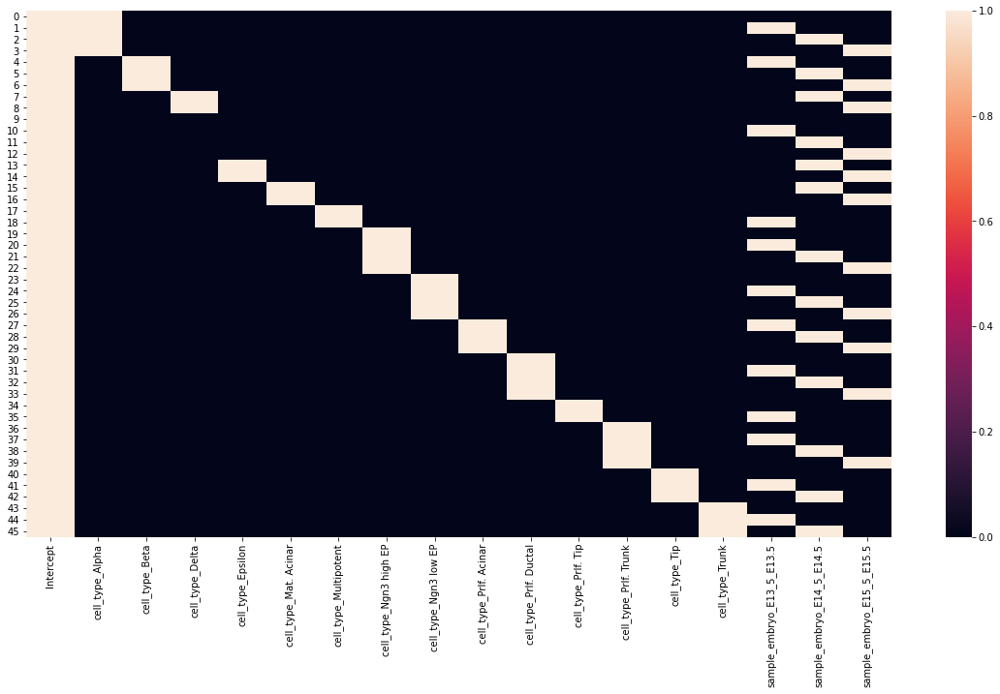

In [78]:
rcParams['figure.figsize']=(20,10)
sb.heatmap(dmat_loc,xticklabels=True)

In [79]:
%%R
# Robust dispersion 
y <- estimateGLMRobustDisp(y, design)

In [80]:
%%R
# Fit - GLM not QL as used robust dispersion
fit <- glmFit(y, design)

In [81]:
%R fit$design

array([[1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.],
       [1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.],
       [1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.],
       [1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1.],
       [1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.],
       [1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.],
       [1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1.],
       [1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0.],
       [1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 1.],
       [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0.],
       [1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0.],
       [1., 0., 0., 0

In [82]:
# Get DE tables - each endo ct to all other cts
summaries={}
for ct_test in ['Alpha','Beta','Delta','Epsilon']:
    summaries_ct={}
    for ct_ref in [c for c in obss.cell_type.unique() if c!=ct_test]:
        # Coef2 in python indexing format
        coef2=np.argwhere(dmat_loc.columns=='cell_type_'+ct_test)[0][0]
        # Coef 1 is not needed if not existing as then testing signif of coef2 only 
        # (compared to intercept, should not be added explicitly!!!)
        # If coef1 is present then compare coef1 and coef2
        coef1=np.argwhere(dmat_loc.columns=='cell_type_'+ct_ref)
        if len(coef1)>0:
            coef1=coef1[0][0]
            contrast=np.zeros(dmat_loc.shape[1])
            contrast[coef1]=-1
            contrast[coef2]=1
            print('ct_test',ct_test,'ct_ref',ct_ref,'coef1',coef1,'coef2',coef2)
            print('Constrast',contrast)
            ro.globalenv['contrast']=contrast
            res=ro.r('glmLRT(fit, contrast=contrast)$table')
        else:
            print('ct_test',ct_test,'ct_ref',ct_ref,'coef2',coef2)
            coef2=coef2+1
            # Coef2 in R indexing format
            print('coef2 R',coef2)
            ro.globalenv['coef2']=coef2
            res=ro.r('glmLRT(fit, coef=coef2)$table')
        # Add padj
        res['padj']=multipletests(res["PValue"].values, alpha=0.05, method='fdr_bh')[1]
        summaries_ct[ct_ref]=res
    summaries[ct_test]=summaries_ct

ct_test Alpha ct_ref Beta coef1 2 coef2 1
Constrast [ 0.  1. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
ct_test Alpha ct_ref Delta coef1 3 coef2 1
Constrast [ 0.  1.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
ct_test Alpha ct_ref Ductal coef2 1
coef2 R 2
ct_test Alpha ct_ref Epsilon coef1 4 coef2 1
Constrast [ 0.  1.  0.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
ct_test Alpha ct_ref Mat. Acinar coef1 5 coef2 1
Constrast [ 0.  1.  0.  0.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
ct_test Alpha ct_ref Multipotent coef1 6 coef2 1
Constrast [ 0.  1.  0.  0.  0.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
ct_test Alpha ct_ref Ngn3 high EP coef1 7 coef2 1
Constrast [ 0.  1.  0.  0.  0.  0.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
ct_test Alpha ct_ref Ngn3 low EP coef1 8 coef2 1
Constrast [ 0.  1.  0.  0.  0.  0.  0.  0. -1.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
ct_test Alpha ct_ref Prlf. Acinar coef1

#### Save

In [83]:
file=path_save_r+'DEedgeR_'
file

'/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/combined/celltypes_embryo/DEedgeR_'

In [84]:
%%R -i file
# Save fits
save(y,fit,file=paste0(file,'fits.RData'))

In [85]:
#%%R -i file
# Reload
#load(file=paste0(file,'fits.RData'))

In [86]:
# Save summary tables
pickle.dump(summaries,open(file+'endo_summaries.pkl','wb'))

In [87]:
# Reload results
#summaries=pickle.load(open(file+'endo_summaries.pkl','rb'))

## Analyse DE

In [88]:
# Collect DE datas for single ct
# test ct is compared against all otehr ref cts
cts_test=summaries.keys()
de_datas=defaultdict(list)
for ct_test,summaries_sub in summaries.items():
    for ct_ref,res in summaries_sub.items():
        de_data=res.copy()
        de_data['ct_test']=ct_test
        de_data['ct_ref']=ct_ref
        de_datas[ct_test].append(de_data)
for ct,de_data in de_datas.items():
    de_datas[ct]=pd.concat(de_data,axis=0)
    
# Find significant genes (against all cts) and min lfc across compared cts
LFC=1
PADJ=0.05
de_res={}
for ct,de_data in de_datas.items():
    # Find signif comparisons
    n_cts_ref=de_data['ct_ref'].nunique()
    de_data_signif=de_data.query('padj<@PADJ & logFC>@LFC'
                         ).reset_index().rename({'index':'gene'},axis=1).groupby('gene')
    de_genes=pd.DataFrame(de_data_signif.size().rename('n')).query('n==@n_cts_ref').index
    # Min lfc across comparisons
    de_data=de_data['logFC'].reset_index().rename({'index':'gene'},axis=1).\
        groupby('gene').min().loc[de_genes,:]
    de_res[ct]=de_data
    print(ct,'N genes:',de_data.shape[0])

Alpha N genes: 31
Beta N genes: 62
Delta N genes: 65
Epsilon N genes: 59


Visualise selected genes with lowest LFC at different LFC thresholds to determine where the cut should be made to still get good markers

Alpha


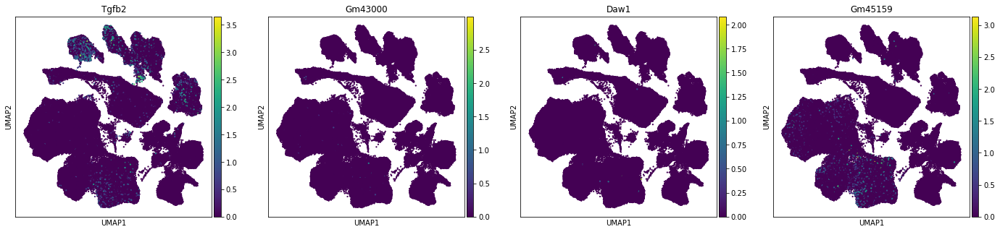

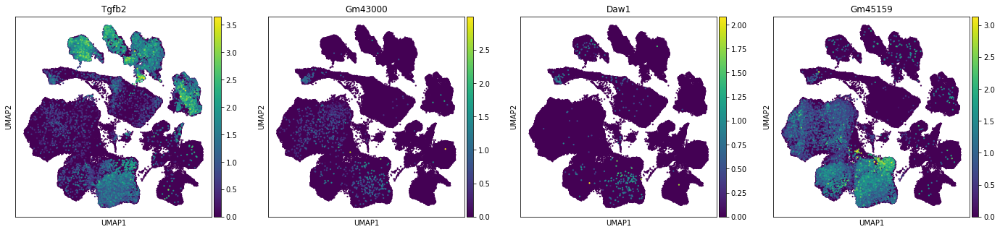

Beta


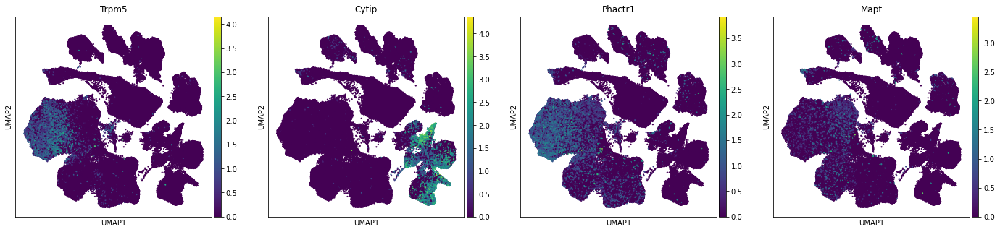

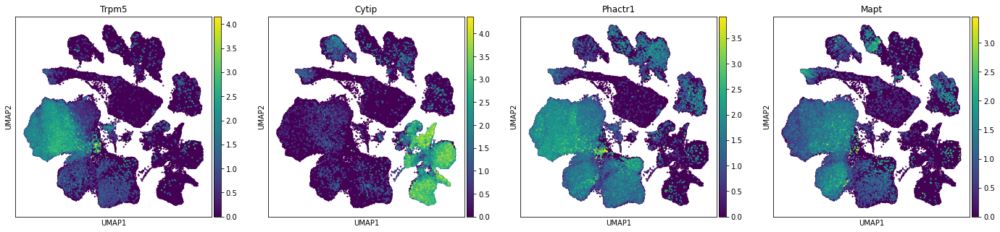

Delta


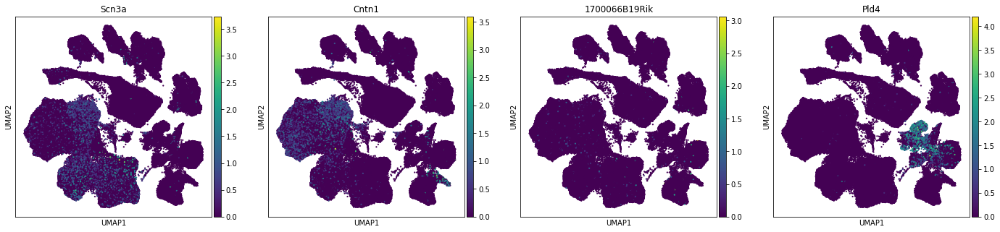

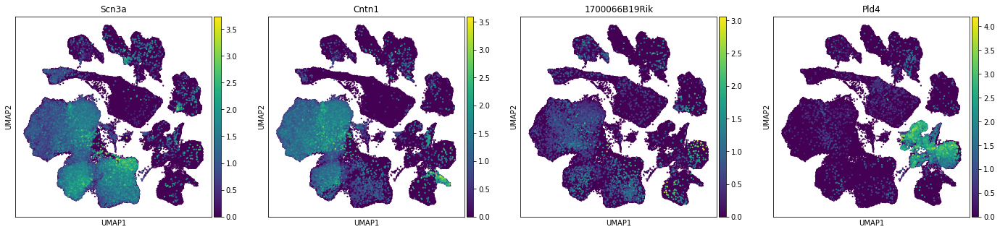

Epsilon


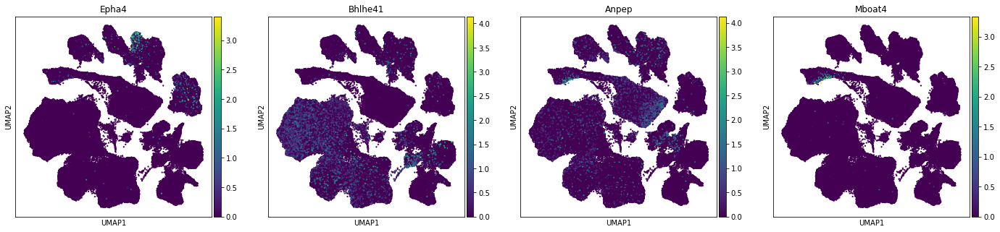

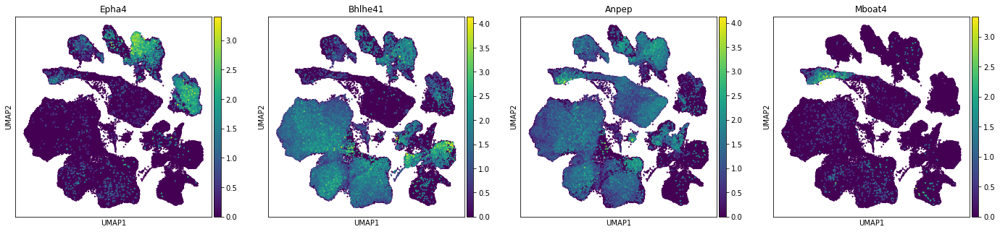

In [89]:
# At lFC=2
# Plot lowest lFC genes to make sure lFC thr is ok
for ct,de in de_res.items():
    print(ct)
    rcParams['figure.figsize']=(5,5)
    genes=var.loc[de.sort_values('logFC').query('logFC>2').head(4).index,'gene_symbol'].to_list()
    random_indices=np.random.permutation(list(range(adata_rn.shape[0])))
    sc.pl.umap(adata_rn[random_indices,:],color=genes,gene_symbols='gene_symbol',
               s=20,sort_order=False)
    sc.pl.umap(adata_rn,color=genes,gene_symbols='gene_symbol',
               s=20)

Alpha


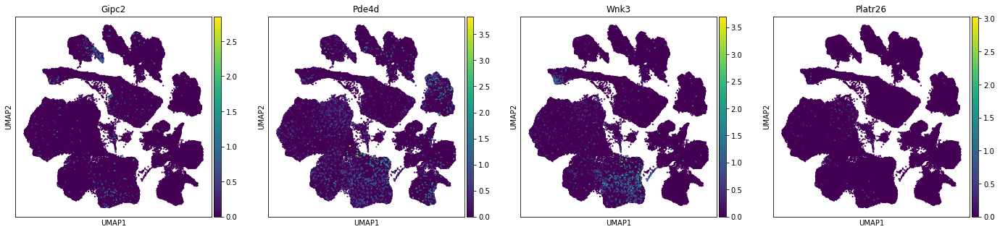

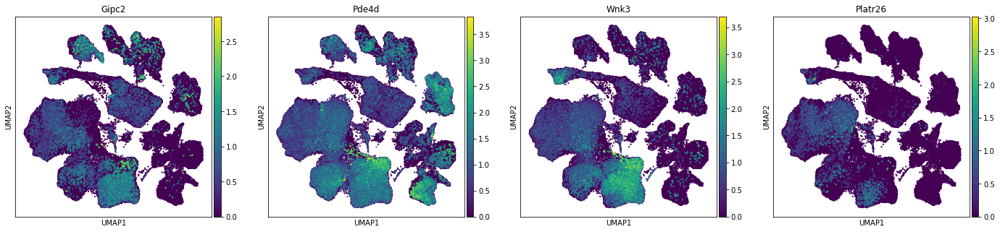

Beta


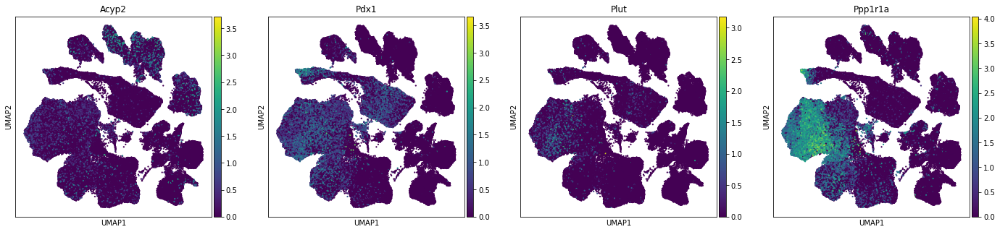

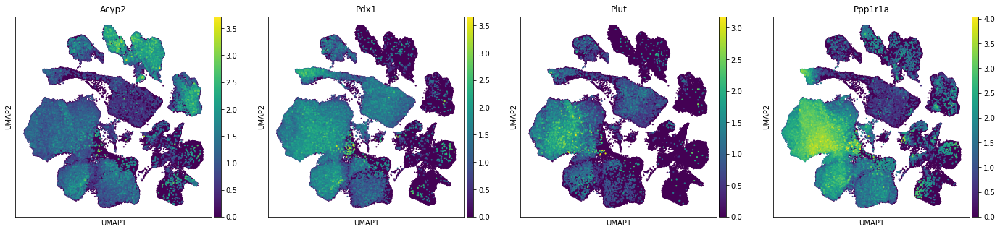

Delta


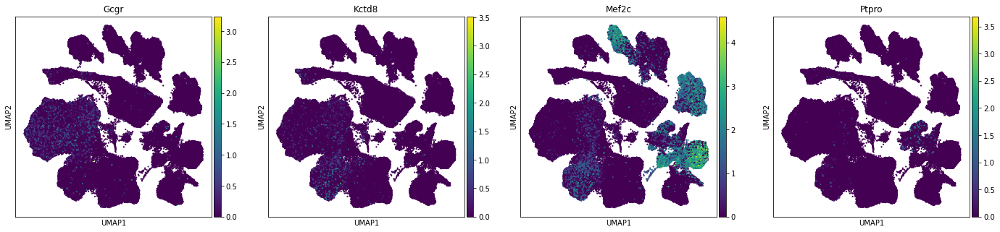

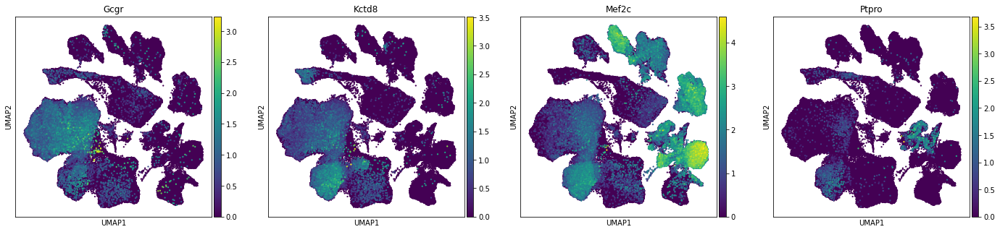

Epsilon


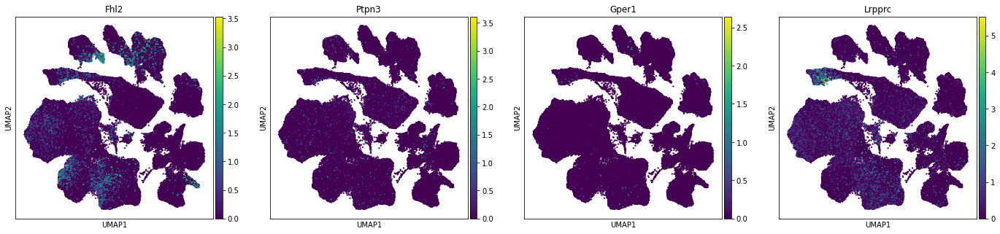

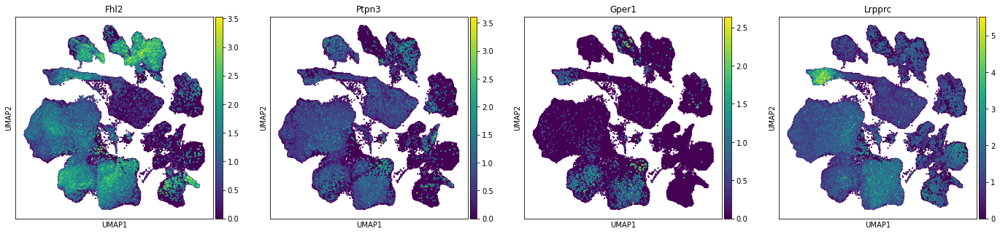

In [90]:
# At lFC=1.5
# Plot lowest lFC genes to make sure lFC thr is ok
for ct,de in de_res.items():
    print(ct)
    rcParams['figure.figsize']=(5,5)
    genes=var.loc[de.sort_values('logFC').query('logFC>1.5').head(4).index,'gene_symbol'].to_list()
    random_indices=np.random.permutation(list(range(adata_rn.shape[0])))
    sc.pl.umap(adata_rn[random_indices,:],color=genes,gene_symbols='gene_symbol',
               s=20,sort_order=False)
    sc.pl.umap(adata_rn,color=genes,gene_symbols='gene_symbol',
               s=20)

Alpha


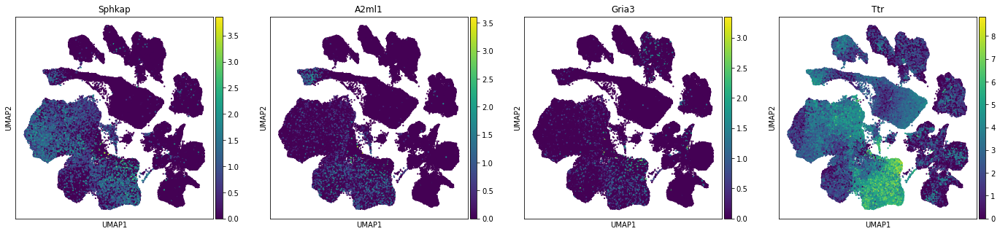

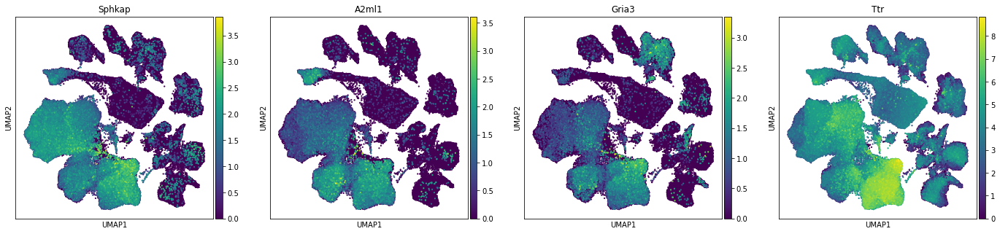

Beta


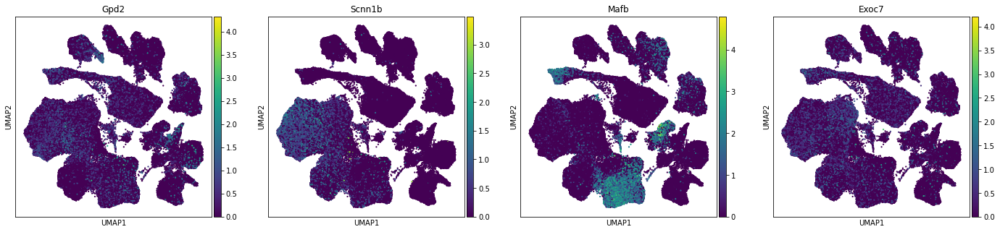

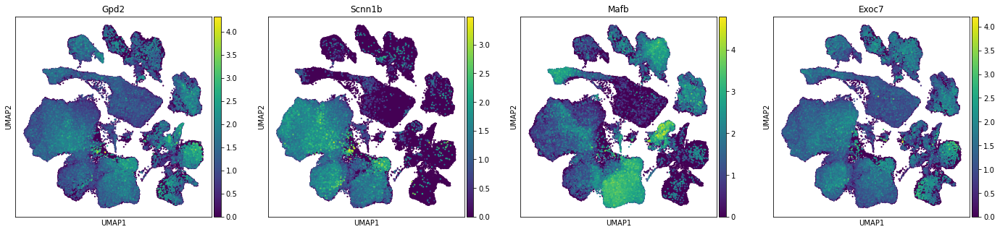

Delta


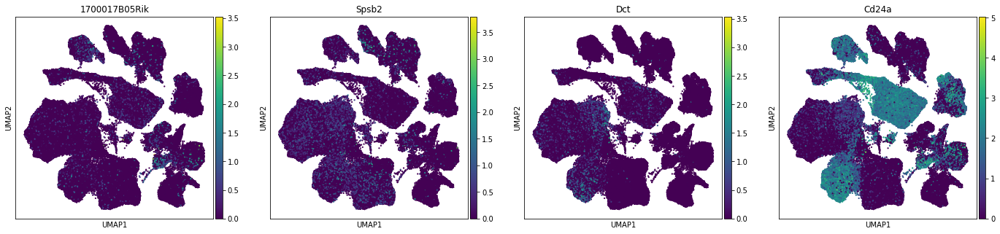

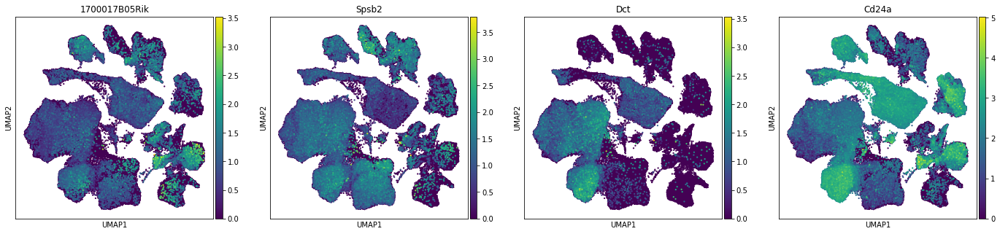

Epsilon


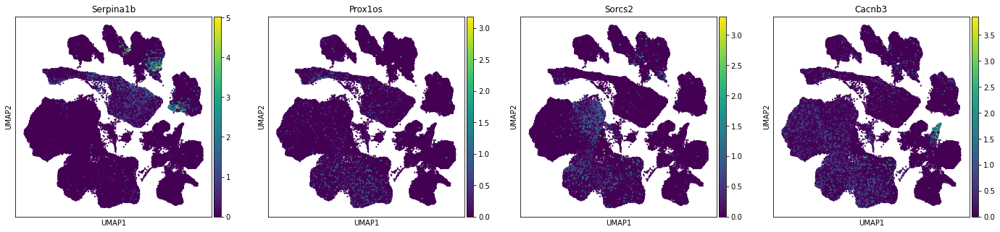

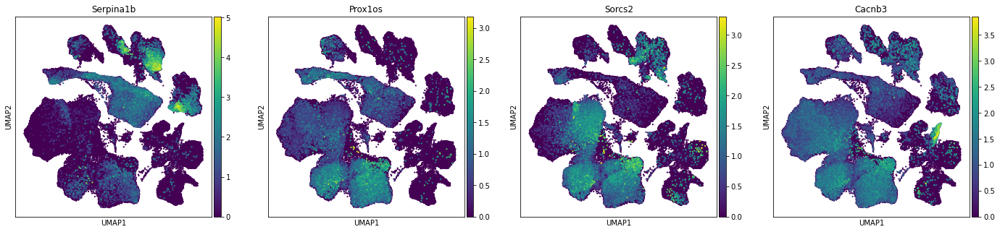

In [91]:
# At lFC=1
# Plot lowest lFC genes to make sure lFC thr is ok
for ct,de in de_res.items():
    print(ct)
    rcParams['figure.figsize']=(5,5)
    genes=var.loc[de.sort_values('logFC').query('logFC>1').head(4).index,'gene_symbol'].to_list()
    random_indices=np.random.permutation(list(range(adata_rn.shape[0])))
    sc.pl.umap(adata_rn[random_indices,:],color=genes,gene_symbols='gene_symbol',
               s=20,sort_order=False)
    sc.pl.umap(adata_rn,color=genes,gene_symbols='gene_symbol',
               s=20)

C: Low lFC genes may be not specific enough - expressed elsewhere or only in part of the cells. In general, lFC=1 thr is probably too low.

C: As there is no comparison to postnatal cts these markers will not work on postnatal - high in some other cts as well.

In [92]:
# Selected LFC threshold
LFC_thr=1.5

In [93]:
# Print markers sorted by lFC
for ct,de, in de_res.items():
    print(ct)
    genes=var.loc[de.sort_values('logFC',ascending=False).query('logFC>@LFC_thr').index,
                  'gene_symbol'].to_list()
    print(len(genes))
    print(genes)

Alpha
14
['Calcr', 'Gcg', 'Gm45159', 'Daw1', 'Gm43000', 'Tgfb2', 'Peg10', 'Asb4', 'Gast', 'T2', 'Platr26', 'Wnk3', 'Pde4d', 'Gipc2']
Beta
42
['Ins2', 'Ins1', 'Npy', 'Sytl4', 'Tmem215', 'Col6a6', 'Col6a3', 'Mnx1', 'Mafa', 'C2cd4a', 'Cbln1', 'Gip', 'Tmem252', 'Gm43948', 'Adra2a', 'Rims3', 'Cnr1', 'Acvr1c', 'Prss53', 'Slc24a2', 'Nnat', 'Gm2694', 'Arhgap36', 'Mapt', 'Phactr1', 'Cytip', 'Trpm5', 'Cdx2', 'Mbl2', 'G6pc2', 'Hdgfl3', 'Gm27033', 'Plppr1', 'Gng12', 'Cdkn2b', 'Lypd6b', 'Cdh23', 'Krt87', 'Ppp1r1a', 'Plut', 'Pdx1', 'Acyp2']
Delta
48
['Sst', 'Masp1', 'H2-Ab1', 'Ctss', 'Cd52', 'Tacr3', 'Aif1', 'Dscam', 'Cacna2d2', 'Kcnc2', 'Spock3', 'Nrsn1', 'Mmp16', 'Fxyd7', 'Coro1a', 'Bmp3', 'Tyrobp', 'Ptprz1', 'Trim14', 'Cfap61', 'Luzp2', 'Tm6sf1', 'Dpysl3', 'Tmem132b', 'Shisal2b', 'Hhex', 'Col25a1', 'Pld4', '1700066B19Rik', 'Cntn1', 'Scn3a', 'Dlgap1', 'Oxtr', 'Unc5b', 'Stk32a', 'Gap43', 'Ngb', 'Ppp1r17', 'Gm45623', 'Egr3', 'Ppp1r14c', 'Stxbp5l', 'Slc16a7', 'Glis1', 'Ptpro', 'Mef2c', 'Kctd8', 'Gcgr

C: Some markers at the end of lists may not be as specific (e.g. for gamma)

Alpha


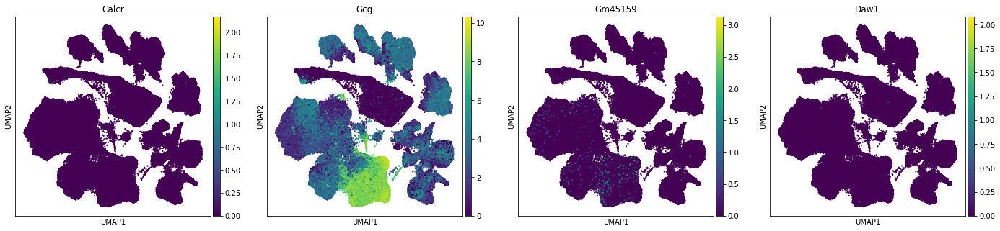

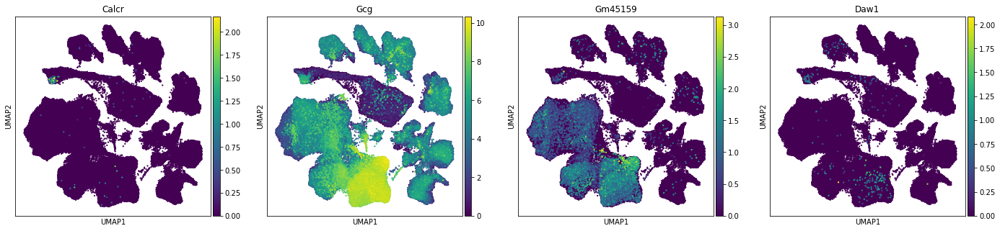

Beta


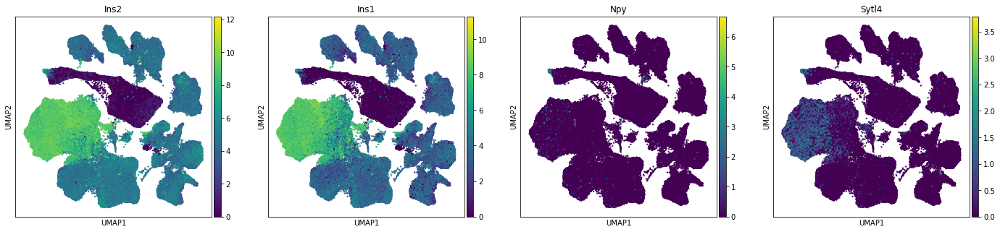

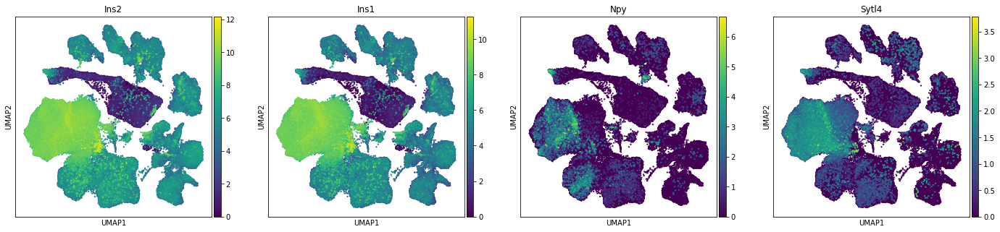

Delta


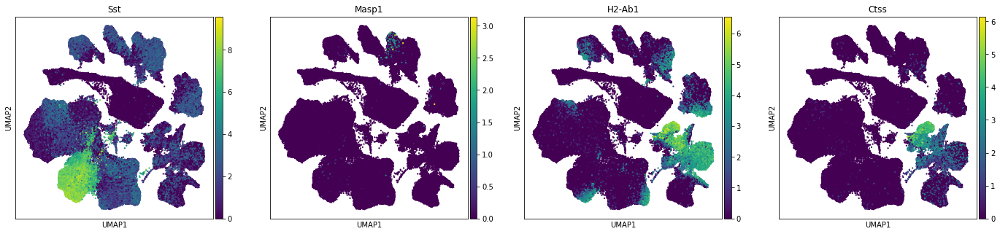

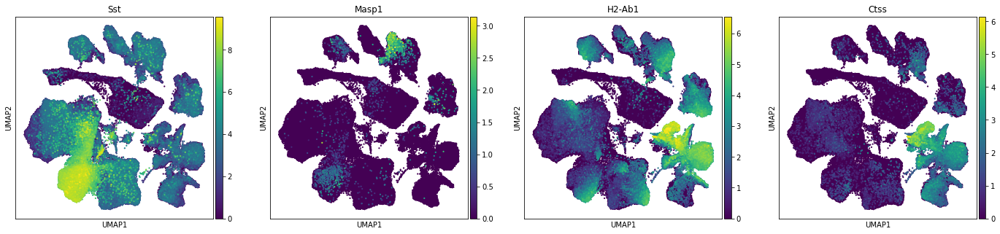

Epsilon


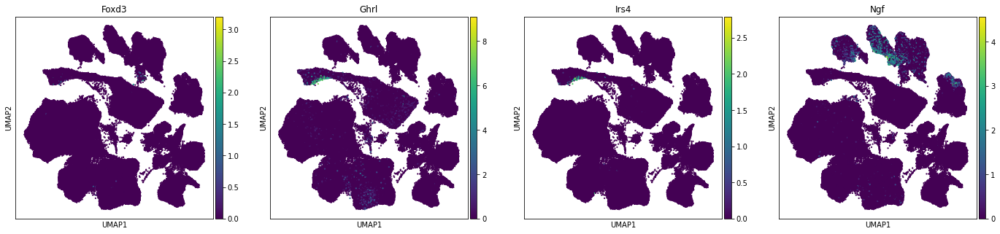

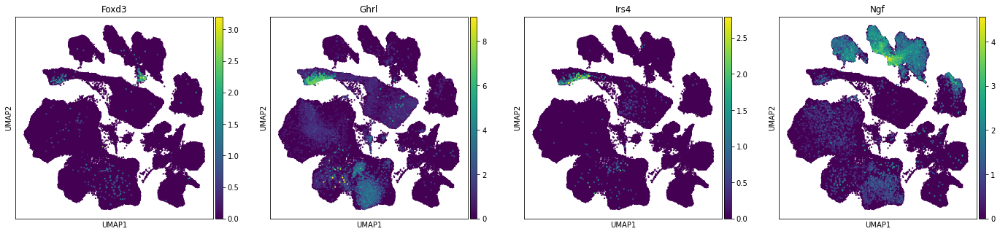

In [94]:
# Plot top markers
for ct,de in de_res.items():
    print(ct)
    rcParams['figure.figsize']=(5,5)
    genes=var.loc[de.sort_values('logFC',ascending=False).query('logFC>@LFC_thr').head(4).index,'gene_symbol'].to_list()
    random_indices=np.random.permutation(list(range(adata_rn.shape[0])))
    sc.pl.umap(adata_rn[random_indices,:],color=genes,gene_symbols='gene_symbol',
               s=20,sort_order=False)
    sc.pl.umap(adata_rn,color=genes,gene_symbols='gene_symbol',
               s=20)

C: top markers look ok although some may be a bit lowly expressed

#### Save
Report for all genes max padj and lFC as follows: if all LFC>0 report min, if all lFC<0 report max, if mixed signs report 0.

In [95]:
# Report max padj and parsed lfc
writer = pd.ExcelWriter(file+'summaries_ctParsed.xlsx',engine='xlsxwriter') 
for ct,de_data in de_datas.items():
    # Group by gene and compute min lFC and max padj across genes
    gene_data=de_data.reset_index().rename({'index':'gene'},axis=1).groupby('gene')
    de_summary=pd.concat([gene_data['logFC'].apply(
        lambda x: 0 if (x>0).any() and (x<0).any() else 
        (x.min() if (x>0).all() else x.max())),
                          gene_data['padj'].min()],axis=1
                        ).sort_values('logFC',ascending=False)
    de_summary['gene_symbol']=var.loc[de_summary.index,'gene_symbol']
    de_summary.to_excel(writer, sheet_name=str(ct))   
writer.save()

In [96]:
file+'summaries_ctParsed.xlsx'

'/lustre/groups/ml01/workspace/karin.hrovatin/data/pancreas/scRNA/combined/celltypes_embryo/DEedgeR_summaries_ctParsed.xlsx'